## Imports and global parameters

In [1]:
import logging
import os

os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
logging.getLogger("tensorflow").setLevel(logging.FATAL)

In [ ]:
import tensorflow as tf
import keras
import keras.backend as K
import optuna
import numpy as np
import sklearn as sk
import matplotlib.pyplot as plt
import pandas as pd
import random
import gc
import plotly
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import r2_score, root_mean_squared_error
from keras import layers
from optuna.visualization import plot_contour, plot_param_importances

In [ ]:
!mkdir -p ../models
!chown 777 ../models

gpus = tf.config.experimental.list_physical_devices("GPU")
print(gpus)

if len(gpus) > 0:
    tf.config.experimental.set_memory_growth(gpus[0], True)

## Notebook parameters

In [4]:
IMG_PATH = "../data/img"
DATASET_FOLDER = "../data"
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 64
IM_SHAPE = (500, 500, 3)
MAX_EPOCHS = 50
MODEL_SELECTION_STEPS = 50
USE_DATASETS_FROM_PAPER = True

# Data preprocessing

### Read csv files and create datasets

In [5]:
df = pd.read_csv(f"{DATASET_FOLDER}/data.csv")
df["id"] = df["id"].apply(lambda id: os.path.join(IMG_PATH, id))
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5933 entries, 0 to 5932
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id         5933 non-null   object 
 1   translErr  5933 non-null   float64
 2   rotErr     5933 non-null   float64
 3   area       5933 non-null   float64
dtypes: float64(3), object(1)
memory usage: 185.5+ KB


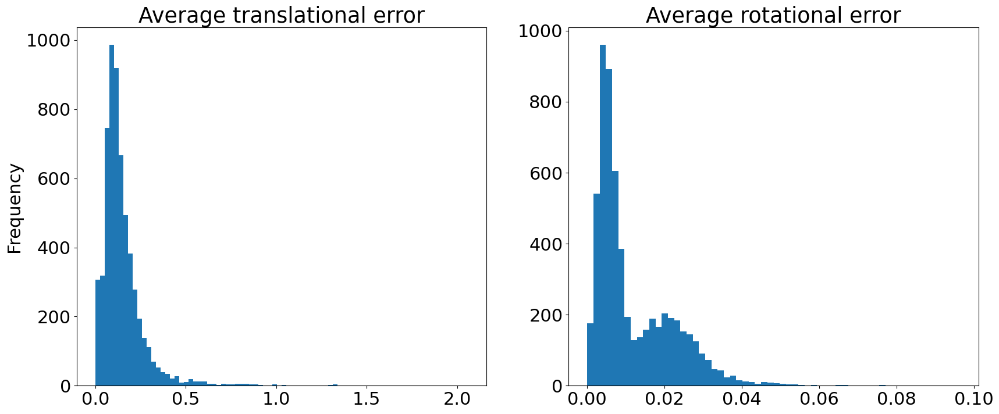

In [7]:
# import matplotlib
# matplotlib.rcParams['font.size'] = 22
fig, ax = plt.subplots(1, 2)
fig.set_figwidth(20)
fig.set_figheight(8)

df["translErr"].plot.hist(bins=80, title="Average translational error", ax=ax[0])
df["rotErr"].plot.hist(bins=60, title="Average rotational error", ax=ax[1], ylabel="")
plt.show()

#### Data rescaling

In [12]:
TRANSL_QUANTILE = df["translErr"].quantile(0.99)
ROT_QUANTILE = df["rotErr"].quantile(0.99)
print(f"Quantiles used for rescaling:\n{TRANSL_QUANTILE=}\n{ROT_QUANTILE=}")

Quantiles used for rescaling:
TRANSL_QUANTILE=0.6805160800000012
ROT_QUANTILE=0.04335412000000012


In [13]:
df["rotErr"] /= ROT_QUANTILE
df["translErr"] /= TRANSL_QUANTILE
df["area"] /= df["area"].max()
df.head()

,id,translErr,rotErr,area
0,../data/img/32-G5.png,0.808063,1.152785,0.097354
1,../data/img/32-G7.png,0.963871,1.119686,0.193957
2,../data/img/32-G9.png,0.678359,0.818100,0.101897
3,../data/img/32-D8.png,0.761860,0.963369,0.147976
4,../data/img/W31-2.png,0.327202,0.398278,0.081962


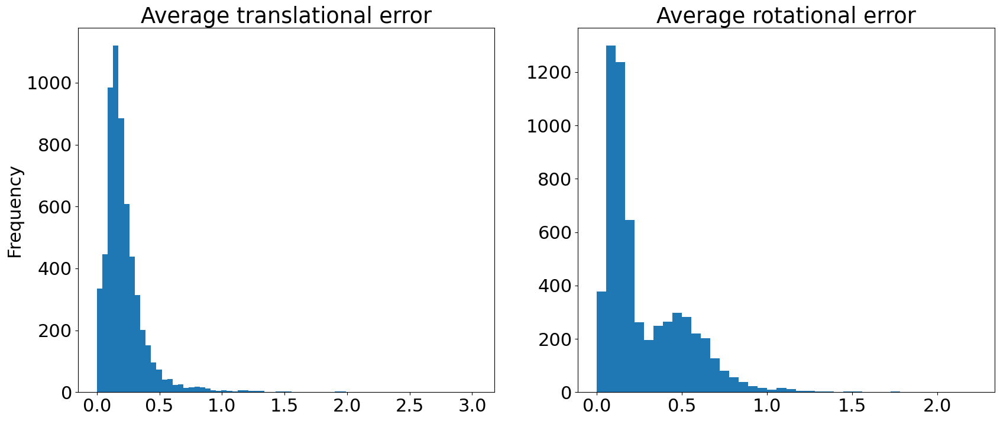

In [17]:
fig, ax = plt.subplots(1, 2)
fig.set_figwidth(20)
fig.set_figheight(8)
df["translErr"].plot.hist(bins=70, title="Average translational error", ax=ax[0])
df["rotErr"].plot.hist(bins=40, title="Average rotational error", ax=ax[1], ylabel="")
plt.show()

### Data partitioning and dataset creation

In [11]:
if USE_DATASETS_FROM_PAPER:
    suffixes = ["train", "val", "test"]
    df_splits = []
    for suff in suffixes:
        temp_df = pd.read_csv(f"{DATASET_FOLDER}/env_ids_{suff}.csv")
        temp_df.env = temp_df.env.apply(lambda x: f"{IMG_PATH}/{x}.png")
        temp_df = df[df["id"].isin(temp_df.env)].drop_duplicates(subset="id")
        df_splits.append(temp_df)

    train_df, val_df, test_df = df_splits

else:
    train_df, test_df = train_test_split(df, test_size=0.3, random_state=42)
    val_df, test_df = train_test_split(test_df, test_size=0.5, random_state=42)

In [12]:
def load_image(id: str):
    image = tf.io.read_file(id)
    image = tf.image.decode_png(image, channels=3)
    return image


def data_augmentation(img: np.ndarray):
    rotation = random.randint(0, 3)
    img = tf.image.rot90(img, k=rotation)
    img = tf.image.random_flip_up_down(img)
    img = tf.image.random_flip_left_right(img)
    return img


def load_dataset(df: pd.DataFrame, augment=False, shuffle=True) -> tf.data.Dataset:
    X = tf.data.Dataset.from_tensor_slices(df["id"].values)
    area = tf.data.Dataset.from_tensor_slices(df["area"].values)
    Y = tf.data.Dataset.from_tensor_slices(df[["translErr", "rotErr"]].values)

    X = X.map(load_image, num_parallel_calls=AUTO)

    if augment:
        X = X.map(lambda img: data_augmentation(img), num_parallel_calls=AUTO)

    dataset = tf.data.Dataset.zip(X, area)
    dataset = tf.data.Dataset.zip(dataset, Y)
    if shuffle:
        dataset = dataset.shuffle(4000, reshuffle_each_iteration=True)

    dataset = dataset.batch(
        batch_size=BATCH_SIZE,
        num_parallel_calls=AUTO,
        deterministic=False,
        drop_remainder=False,
    )
    dataset = dataset.prefetch(5)  # Prefetch n batches
    return dataset


def get_train_val_data() -> tuple:
    train_data = load_dataset(train_df, augment=True)
    val_data = load_dataset(val_df)
    return train_data, val_data


test_data = load_dataset(test_df, shuffle=False)

#### Show a sample datapoint

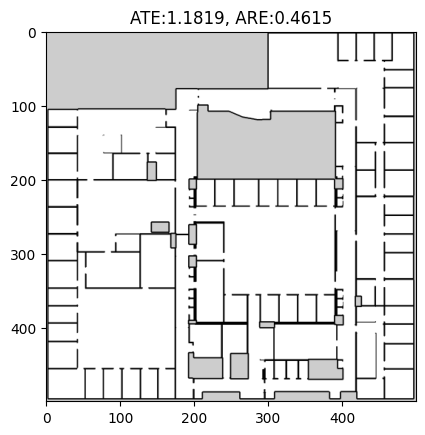

In [13]:
for r in test_data.take(1).as_numpy_iterator():
    r, l = r[0], r[1]
    plt.imshow(r[0][0], cmap="gray")
    plt.title(f"ATE:{l[0][0]:.4f}, ARE:{l[0][1]:.4f}")
    plt.show()
    break

#### Support functions

In [14]:
def plot_history(hst: keras.callbacks.History, label: str):
    metrics = ["loss"]
    _, ax = plt.subplots(1, len(metrics), figsize=(5, 6))
    for _, metric in enumerate(metrics):
        ax.plot(hst.history[metric])
        ax.plot(hst.history["val_" + metric])
        ax.set(title=label + " loss", ylabel=metric, xlabel="epoch", ylim=[0.015, 0.08])
        ax.legend([metric, "val_" + metric], loc="upper left")
    plt.show()


def free_memory():
    gc.collect()
    keras.backend.clear_session(free_memory=True)
    tf.compat.v1.reset_default_graph()

# CNN Architectures

#### Custom ResNet architecture

In [15]:
def residualLayers(x, filters, n_layers, resize_first=True):
    for i in range(n_layers):
        stride = 1
        shortcut = x
        if i == 0 and resize_first:
            shortcut = layers.Conv2D(filters=filters, kernel_size=1, strides=2)(x)
            shortcut = layers.BatchNormalization()(shortcut)
            resize_first = False
            stride = 2

        x = layers.Conv2D(
            filters=filters, kernel_size=3, padding="same", strides=stride
        )(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation("relu")(x)

        x = layers.Conv2D(filters=filters, kernel_size=3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Add()([shortcut, x])
        x = layers.Activation("relu")(x)
    return x


def custom_resNet():
    img_input = layers.Input(shape=IM_SHAPE, batch_size=BATCH_SIZE, name="img_input")
    x = layers.Resizing(224, 224)(img_input)
    area_input = layers.Input(shape=(1,), batch_size=BATCH_SIZE, name="area_input")

    x = layers.Conv2D(filters=64, kernel_size=7, strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.MaxPool2D()(x)

    x = residualLayers(x, 64, 2, resize_first=False)
    x = residualLayers(x, 128, 1, resize_first=True)

    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Flatten(name="cnn_output")(x)

    x = layers.Concatenate()([area_input, x])

    out = layers.Dense(2, activation="relu", name="out_layer")(x)

    model = keras.Model(inputs=[img_input, area_input], outputs=out, name="MyResNet")
    model.compile(
        optimizer=keras.optimizers.SGD(
            learning_rate=0.001, momentum=0.9, weight_decay=0.0001
        ),
        loss="mse",
        jit_compile=False,
    )
    return model

#### Architecture for transfer learning

In [16]:
def _build_resNet():
    resNet = keras.saving.load_model("../models/customResNet.keras")
    resNet.trainable = False
    return resNet


def _build_efficientNet():
    effNet = keras.applications.EfficientNetV2B3(include_top=False, pooling="avg")
    effNet.trainable = False
    return effNet


def _build_mobileNet():
    mobNet = keras.applications.MobileNetV3Large(include_top=False, pooling="avg")
    mobNet.trainable = False
    return mobNet


def build_model(config: dict, back_cnn: str) -> keras.Model:
    backbone_builder = {
        "resnet": _build_resNet,
        "efficientnet": _build_efficientNet,
        "mobilenet": _build_mobileNet,
    }
    cnn = backbone_builder[back_cnn]

    img_input = layers.Input(shape=IM_SHAPE, name="image_input")
    x = cnn()(img_input)

    # skip connection
    area_input = layers.Input(shape=(1,), name="area_input")
    x = layers.Concatenate()([area_input, x])

    for i in range(config["nLayers"]):
        x = layers.Dense(units=config[f"layer{i}_units"], name=f"dense_{i}")(x)
        if config["batchNorm"]:
            x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)

        if config["dropout"]:
            x = layers.Dropout(0.3)(x)

    out = layers.Dense(2, "relu", name="out_layer")(x)

    model = keras.Model(
        inputs=[img_input, area_input], outputs=out, name=f"{back_cnn}_model"
    )

    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=config["lr"]),
        loss="mse",
        jit_compile=False,
    )
    return model

In [17]:
def kFoldCV(hyperPar: dict, training_set: pd.DataFrame, k: int, back_cnn: str) -> float:
    df = training_set.reset_index(drop=True)
    kf = KFold(n_splits=k, shuffle=True)
    scores = []
    for trainIdx, valIdx in kf.split(df):
        train_data = load_dataset(df.iloc[trainIdx], augment=True)
        val_data = load_dataset(df.iloc[valIdx])

        model = build_model(hyperPar, back_cnn)
        es = keras.callbacks.EarlyStopping(patience=7, restore_best_weights=True)
        model.fit(
            train_data,
            batch_size=BATCH_SIZE,
            validation_data=val_data,
            epochs=MAX_EPOCHS,
            callbacks=[es],
        )

        result = model.evaluate(val_data, batch_size=BATCH_SIZE)
        scores.append(result)

        del model
        free_memory()

    return np.average(scores)

In [18]:
def train_and_store_model(hyperpar: dict, backbone: str, tag: str) -> keras.callbacks.History:
    m = build_model(hyperpar, backbone)
    train_data, val_data = get_train_val_data()
    es = keras.callbacks.EarlyStopping(
        patience=7, start_from_epoch=5, restore_best_weights=True
    )

    history = m.fit(
        train_data,
        batch_size=BATCH_SIZE,
        validation_data=val_data,
        epochs=MAX_EPOCHS,
        callbacks=[es],
    )
    m.save(f"../models/{backbone}_model_{tag}.keras")

    del m, train_data, val_data, es
    free_memory()

    return history

In [19]:
baselineHyperparameters = {
    "lr": 1e-3,
    "nLayers": 3,
    "batchNorm": True,
    "dropout": False,
    "layer0_units": 1024,
    "layer1_units": 256,
    "layer2_units": 128,
}

### Train ResNet backbone and store its weights

In [ ]:
es = keras.callbacks.EarlyStopping(patience=9, restore_best_weights=True, start_from_epoch=10, min_delta=1e-4)
lr_redux = keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=7, min_lr=0.00001)
train_data, val_data = get_train_val_data()

m = custom_resNet()
hst_resnet = m.fit(
    train_data,
    batch_size=BATCH_SIZE,
    validation_data=val_data,
    epochs=MAX_EPOCHS * 2,
    callbacks=[lr_redux, es],
)

# Save only the CNN layers
cnn_out_layer = m.get_layer("cnn_output").output
cnn_input_layer = m.get_layer("img_input").output
tail_model = keras.Model(inputs=cnn_input_layer, outputs=cnn_out_layer)
tail_model.save("../models/customResNet.keras")

In [40]:
del m, tail_model, es, lr_redux, train_data, val_data
free_memory()

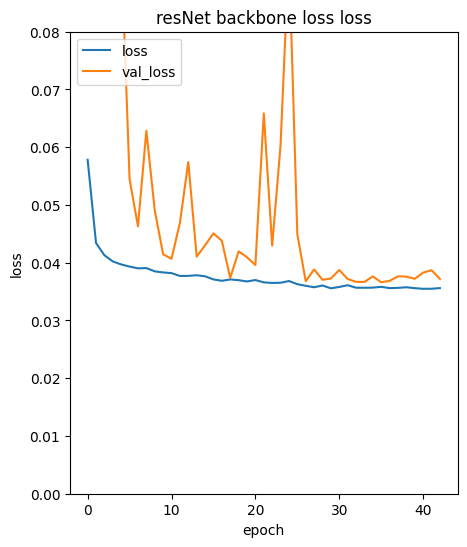

In [41]:
plot_history(hst_resnet, "resNet backbone loss")

### Train custom ResNet with baseline config

In [ ]:
hst_base_resNet = train_and_store_model(baselineHyperparameters, "resnet", "baseline")

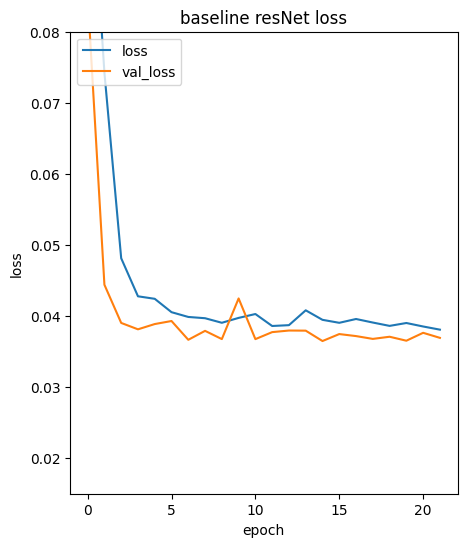

In [21]:
plot_history(hst_base_resNet, "baseline resNet")

##### Cross-validate baseline config

In [ ]:
cv_df = pd.concat([train_df, val_df], ignore_index=True)
CV_loss_resNet_base = kFoldCV(baselineHyperparameters, cv_df, 5, "resnet")

In [45]:
print(CV_loss_resNet_base)

0.04162846580147743


### Train EfficientNetV2 with baseline config

In [ ]:
hst_base_effNet = train_and_store_model(baselineHyperparameters, "efficientnet", "baseline")

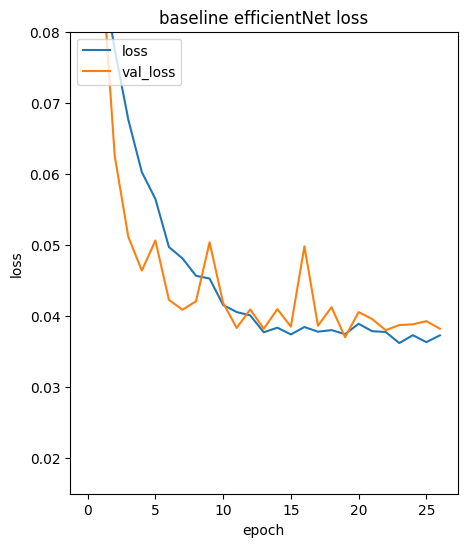

In [21]:
plot_history(hst_base_effNet, "baseline efficientNet")

In [ ]:
cv_df = pd.concat([train_df, val_df], ignore_index=True)
CV_loss_effNet_base = kFoldCV(baselineHyperparameters, cv_df, 5, "efficientnet")

In [49]:
print(CV_loss_effNet_base)

0.03823099061846733


### Train MobileNetV3 with baseline config

In [ ]:
hst_base_mobNet = train_and_store_model(baselineHyperparameters, "mobilenet", "baseline")

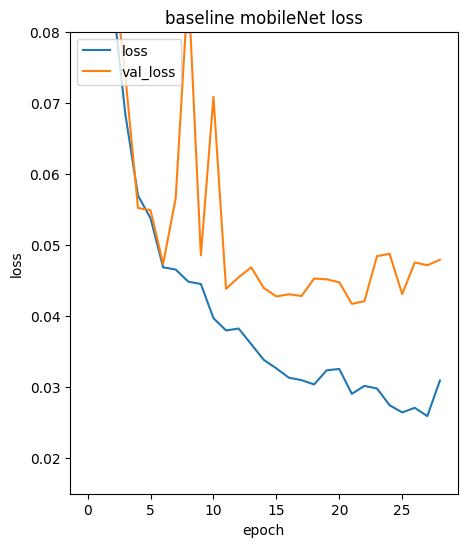

In [23]:
plot_history(hst_base_mobNet, "baseline mobileNet")

In [ ]:
cv_df = pd.concat([train_df, val_df], ignore_index=True)
CV_loss_mobNet_base = kFoldCV(baselineHyperparameters, cv_df, 5, "mobilenet")

In [53]:
print(CV_loss_mobNet_base)

0.04710590690374374


# Hyperparameter tuning

In [26]:
def obj_builder(backbone_model: str):  # inner def for currying obj function
    def objective(trial: optuna.Trial) -> float:
        free_memory()
        best_val_loss = np.inf
        patience = 0
        config = {
            "lr": trial.suggest_float("lr", 1e-5, 1e-2, log=True),
            "nLayers": trial.suggest_int("nLayers", 1, 6),
            "batchNorm": trial.suggest_categorical("batchNorm", [True, False]),
            "dropout": trial.suggest_categorical("dropout", [True, False]),
        }

        layerDim = [64, 128, 256, 512, 1024, 2048]
        for i in range(config["nLayers"]):
            config[f"layer{i}_units"] = trial.suggest_categorical(
                f"layer{i}_units", layerDim
            )

        model = build_model(config, backbone_model)
        train_data = load_dataset(train_df, augment=True)
        val_data = load_dataset(val_df)

        for train_step in range(MAX_EPOCHS // 2):
            history = model.fit(
                train_data, batch_size=BATCH_SIZE, validation_data=val_data
            )
            val_loss = history.history["val_loss"][0]

            # Implement earlystopping
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                patience = 0
            else:
                patience += 1

            if patience > 7:
                break

            trial.report(val_loss, train_step)
            if trial.should_prune():
                del model, history, train_data, val_data
                raise optuna.TrialPruned()

        alloc = tf.config.experimental.get_memory_info("GPU:0")["current"]
        print(f"Current GPU memory allocation: {alloc/1e6:.2f}MB")
        del model, train_data, val_data
        return best_val_loss

    return objective

## Optimize custom ResNet

In [ ]:
study = optuna.create_study(
    direction="minimize",
    sampler=optuna.samplers.TPESampler(),
    pruner=optuna.pruners.HyperbandPruner(min_resource=3, max_resource=20),
    study_name="resNet_study",
)

study.enqueue_trial(baselineHyperparameters)  # Test on baseline parameters first
study.optimize(
    obj_builder("resnet"),
    n_trials=MODEL_SELECTION_STEPS,
    gc_after_trial=True,
    show_progress_bar=True,
)
free_memory()

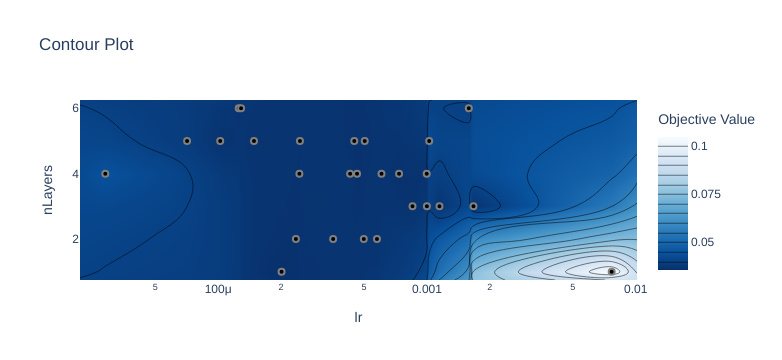

In [28]:
plot_contour(study, params=["lr", "nLayers"])

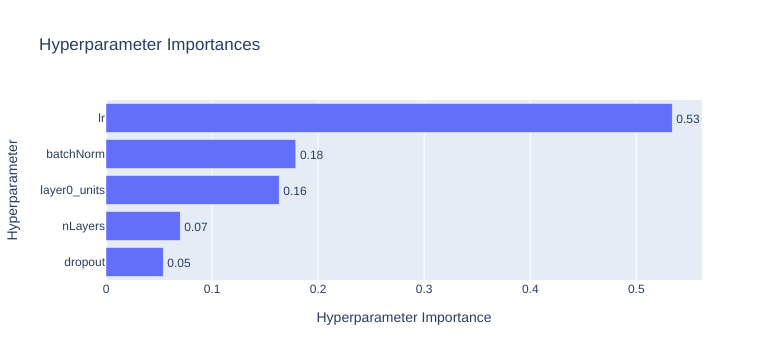

In [29]:
plot_param_importances(study)

In [30]:
study.best_params

{'lr': 0.0002013859161027282,
 'nLayers': 1,
 'batchNorm': False,
 'dropout': True,
 'layer0_units': 1024}

#### Cross Validate the optimized architecture

In [ ]:
cv_df = pd.concat([train_df, val_df], ignore_index=True)
CV_loss_resNet = kFoldCV(study.best_params, cv_df, 5, "resnet")

In [32]:
print(f"{CV_loss_resNet=}")

CV_loss_resNet=0.03672204464673996


In [ ]:
hst_opt_resNet = train_and_store_model(study.best_params, "resnet", "optimized")

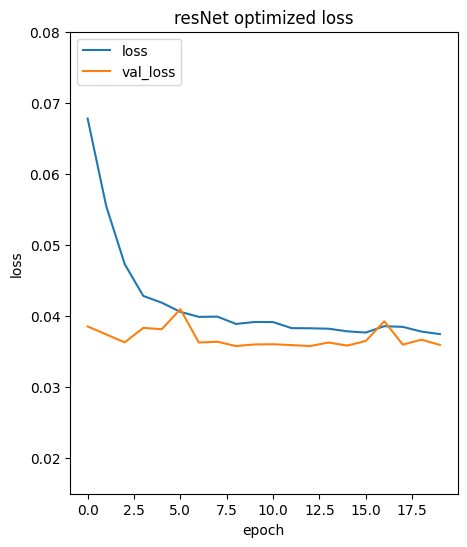

In [34]:
plot_history(hst_opt_resNet, "resNet optimized")

## Optimize EfficientNetV2

In [ ]:
study = optuna.create_study(
    direction="minimize",
    sampler=optuna.samplers.TPESampler(),
    pruner=optuna.pruners.HyperbandPruner(min_resource=3, max_resource=20),
    study_name="efficientNet_study",
)

study.enqueue_trial(baselineHyperparameters)  # Test on baseline parameters first
study.optimize(
    obj_builder("efficientnet"),
    n_trials=MODEL_SELECTION_STEPS,
    gc_after_trial=True,
    show_progress_bar=True,
)

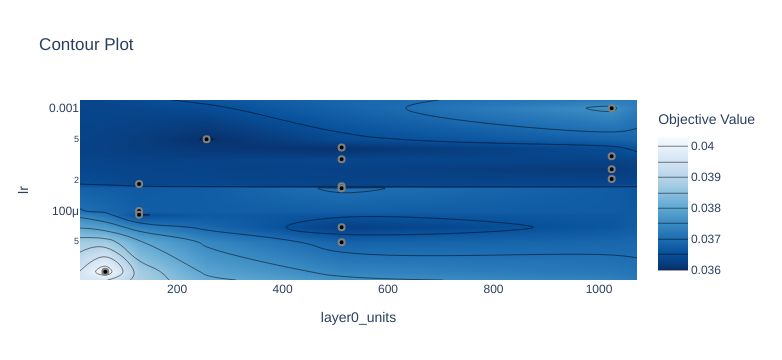

In [27]:
plot_contour(study, params=["layer0_units", "lr"])

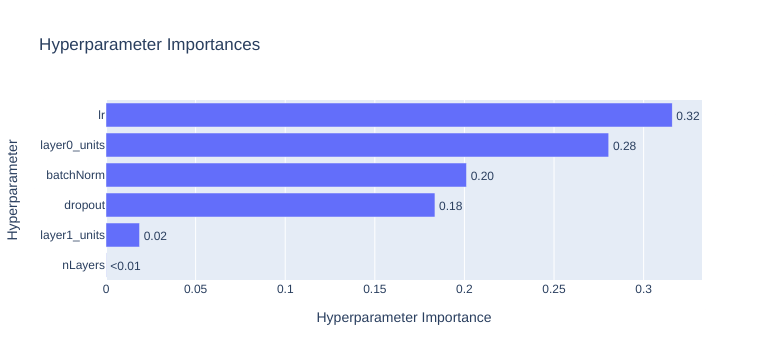

In [25]:
plot_param_importances(study)

In [23]:
study.best_params

{'lr': 0.00049709413378823,
 'nLayers': 5,
 'batchNorm': False,
 'dropout': False,
 'layer0_units': 256,
 'layer1_units': 256,
 'layer2_units': 1024,
 'layer3_units': 512,
 'layer4_units': 512}

#### Cross Validate the optimized architecture

In [ ]:
cv_df = pd.concat([train_df, val_df], ignore_index=True)
CV_loss_effNet = kFoldCV(study.best_params, cv_df, 5, "efficientnet")

In [24]:
CV_loss_effNet

0.037637467682361606

In [ ]:
hst_opt_effNet = train_and_store_model(study.best_params, "efficientnet", "optimized")

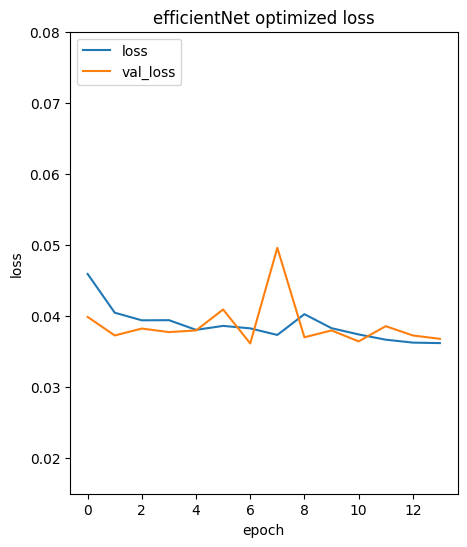

In [26]:
plot_history(hst_opt_effNet, "efficientNet optimized")

## Optimize MobileNetV3_large

In [ ]:
study = optuna.create_study(
    direction="minimize",
    sampler=optuna.samplers.TPESampler(),
    pruner=optuna.pruners.HyperbandPruner(min_resource=3, max_resource=20),
    study_name="mobileNet_study",
)

study.enqueue_trial(baselineHyperparameters)  # Test on baseline parameters first
study.optimize(
    obj_builder("mobilenet"),
    n_trials=MODEL_SELECTION_STEPS,
    gc_after_trial=True,
    show_progress_bar=True,
)

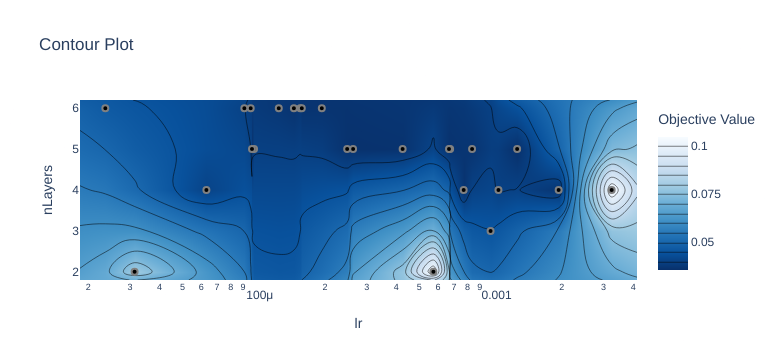

In [22]:
plot_contour(study, params=["lr", "nLayers"])

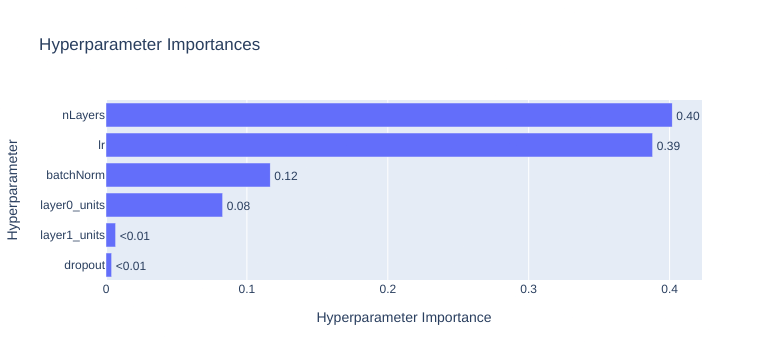

In [23]:
plot_param_importances(study)

In [24]:
study.best_params

{'lr': 0.0012948247104018025,
 'nLayers': 5,
 'batchNorm': False,
 'dropout': False,
 'layer0_units': 512,
 'layer1_units': 64,
 'layer2_units': 64,
 'layer3_units': 64,
 'layer4_units': 128}

In [ ]:
cv_df = pd.concat([train_df, val_df], ignore_index=True)
CV_loss_mobNet = kFoldCV(study.best_params, cv_df, 5, "mobilenet")

In [26]:
CV_loss_mobNet

0.05198398977518082

In [ ]:
hst_opt_mobNet = train_and_store_model(study.best_params, "mobilenet", "optimized")

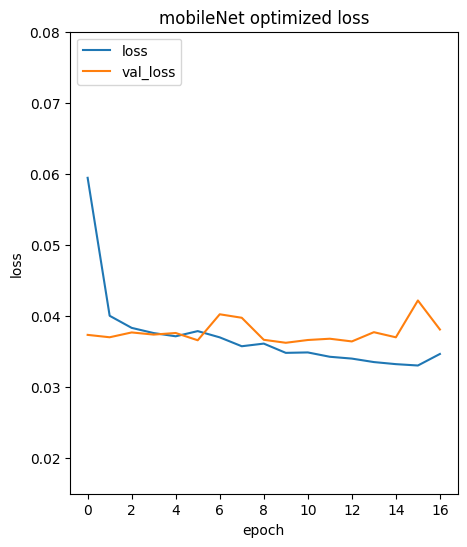

In [28]:
plot_history(hst_opt_mobNet, "mobileNet optimized")

## Compare the models on test data


In [ ]:
modelNames = ["resnet", "efficientnet", "mobilenet"]
base = [f"../models/{m}_model_baseline.keras" for m in modelNames]
opt = [f"../models/{m}_model_optimized.keras" for m in modelNames]
train_data, val_data = get_train_val_data()
val_score, train_score = [], []
test_score = []
for model_name in base + opt:
    m = keras.saving.load_model(model_name)
    train_score.append(m.evaluate(train_data))
    val_score.append(m.evaluate(val_data))
    test_score.append(m.evaluate(test_data))

In [36]:
for i, name in enumerate(base + opt):
    modelName = name.split("/")[-1].split(".")[0]
    print(f"{modelName:>30} training loss:{train_score[i]:.4f}, validation loss:{val_score[i]:.4f}, test loss:{test_score[i]:.4f}")

         resnet_model_baseline training loss:0.0369, validation loss:0.0365, test loss:0.0354
   efficientnet_model_baseline training loss:0.0357, validation loss:0.0370, test loss:0.0364
      mobilenet_model_baseline training loss:0.0263, validation loss:0.0417, test loss:0.0452
        resnet_model_optimized training loss:0.0366, validation loss:0.0358, test loss:0.0352
  efficientnet_model_optimized training loss:0.0352, validation loss:0.0361, test loss:0.0363
     mobilenet_model_optimized training loss:0.0359, validation loss:0.0362, test loss:0.0356


# Performance Evaluation

In [37]:
def rescale_results(y_pred: np.array, y_true: np.array) -> pd.DataFrame:
    df_pred = pd.DataFrame(y_pred, columns=["translation_pred", "rotation_pred"])
    df_true = pd.DataFrame(y_true, columns=["translation_true", "rotation_true"])
    df_final = pd.concat((df_pred, df_true), axis="columns")

    df_final["translation_pred"] *= TRANSL_QUANTILE
    df_final["translation_true"] *= TRANSL_QUANTILE

    df_final["rotation_pred"] *= ROT_QUANTILE
    df_final["rotation_true"] *= ROT_QUANTILE
    return df_final


def print_metrics(df_final: pd.DataFrame, model_name: str) -> tuple:
    R2_transl = r2_score(df_final["translation_true"], df_final["translation_pred"])
    R2_rot = r2_score(df_final["rotation_true"], df_final["rotation_pred"])

    RMSE_transl = root_mean_squared_error(df_final["translation_true"], df_final["translation_pred"])
    RMSE_rot = root_mean_squared_error(df_final["rotation_true"], df_final["rotation_pred"])

    transl_delta = (df_final["translation_true"].max() - df_final["translation_true"].min())
    rot_delta = df_final["rotation_true"].max() - df_final["rotation_true"].min()

    NRMSE_transl = RMSE_transl / transl_delta
    NRMSE_rot = RMSE_rot / rot_delta

    print(f"*** {model_name} ***")
    print(
        f"""\t{R2_transl=:.4f},\t{R2_rot=:.4f}
        {RMSE_transl=:.4f},\t{RMSE_rot=:.4f}
        {NRMSE_transl=:.4f},\t{NRMSE_rot=:.4f}"""
    )

In [38]:
for model_name in base + opt:
    m = keras.saving.load_model(model_name)
    y_pred = m.predict(test_data)

    y_true = [y for (_, _), y in test_data.unbatch().as_numpy_iterator()]
    y_true = np.array(y_true)

    df_perf = rescale_results(y_pred, y_true)
    print_metrics(df_perf, model_name)

14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step
*** ../models/resnet_model_baseline.keras ***
	R2_transl=0.4340,	R2_rot=0.0516
        RMSE_transl=0.1021,	RMSE_rot=0.0095
        NRMSE_transl=0.0495,	NRMSE_rot=0.1314


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:225: UserWarning:

The structure of `inputs` doesn't match the expected structure: ['image_input', 'area_input']. Received: the structure of inputs=('*', '*')



14/14 ━━━━━━━━━━━━━━━━━━━━ 10s 623ms/step
*** ../models/efficientnet_model_baseline.keras ***
	R2_transl=0.4397,	R2_rot=0.0079
        RMSE_transl=0.1015,	RMSE_rot=0.0097
        NRMSE_transl=0.0493,	NRMSE_rot=0.1344


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:225: UserWarning:

The structure of `inputs` doesn't match the expected structure: ['image_input', 'area_input']. Received: the structure of inputs=('*', '*')



14/14 ━━━━━━━━━━━━━━━━━━━━ 5s 298ms/step
*** ../models/mobilenet_model_baseline.keras ***
	R2_transl=0.2502,	R2_rot=-0.1882
        RMSE_transl=0.1175,	RMSE_rot=0.0107
        NRMSE_transl=0.0570,	NRMSE_rot=0.1470
 1/14 ━━━━━━━━━━━━━━━━━━━━ 2s 224ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:225: UserWarning:

The structure of `inputs` doesn't match the expected structure: ['image_input', 'area_input']. Received: the structure of inputs=('*', '*')



14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step
*** ../models/resnet_model_optimized.keras ***
	R2_transl=0.4475,	R2_rot=0.0501
        RMSE_transl=0.1008,	RMSE_rot=0.0095
        NRMSE_transl=0.0489,	NRMSE_rot=0.1315


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:225: UserWarning:

The structure of `inputs` doesn't match the expected structure: ['image_input', 'area_input']. Received: the structure of inputs=('*', '*')



14/14 ━━━━━━━━━━━━━━━━━━━━ 11s 649ms/step
*** ../models/efficientnet_model_optimized.keras ***
	R2_transl=0.4046,	R2_rot=0.0404
        RMSE_transl=0.1047,	RMSE_rot=0.0096
        NRMSE_transl=0.0508,	NRMSE_rot=0.1321


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:225: UserWarning:

The structure of `inputs` doesn't match the expected structure: ['image_input', 'area_input']. Received: the structure of inputs=('*', '*')



14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 266ms/step
*** ../models/mobilenet_model_optimized.keras ***
	R2_transl=0.4319,	R2_rot=0.0459
        RMSE_transl=0.1022,	RMSE_rot=0.0096
        NRMSE_transl=0.0496,	NRMSE_rot=0.1318
